In [2]:
import os
import warnings
warnings.filterwarnings('ignore')
from os import listdir
import csv
import numpy as np
import plotly.express as px
import pandas as pd
from matplotlib import pyplot as plt
from scipy.signal import find_peaks, peak_prominences
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Conv1D, Dense, Dropout, Lambda, concatenate, Activation, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import activations
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau

In [3]:
data2019 = pd.read_csv("/users/sanaa.el-bouhdidi/Projet2/data/data2019.csv",
                             delimiter=","
                  )
data2019

,date (TU),Pauillac,Verdon,Bordeaux
0,2019-01-01 00:00:00,4.00,4.34,2.89
1,2019-01-01 00:05:00,4.05,4.35,2.98
2,2019-01-01 00:10:00,4.09,4.36,3.06
3,2019-01-01 00:15:00,4.13,4.37,3.13
4,2019-01-01 00:20:00,4.15,4.38,3.20
...,...,...,...,...
105115,2019-12-31 23:35:00,2.99,2.70,3.39
105116,2019-12-31 23:40:00,2.95,2.64,3.34
105117,2019-12-31 23:45:00,2.89,2.58,3.28
105118,2019-12-31 23:50:00,2.82,2.52,3.23


In [4]:
dataset = data2019.set_index('date (TU)')

divide data

In [5]:
from sklearn.preprocessing import MinMaxScaler
#The split_sequence() function will split a given multivariate time series into multiple samples where each sample has a specified number of input and output time steps.
def split_sequences(sequences, n_steps_in, n_steps_out):
    x, y, delta = list(), list(), 1
    for i in range(len(sequences)-n_steps_in-1): 
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out-1
        if out_end_ix > len(sequences):
            break
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, 0]
        x.append(seq_x)
        y.append(seq_y)
    return np.array(x), np.array(y)
 
#normalize data
sc = MinMaxScaler()
training_data = sc.fit_transform(dataset)

n_steps_in, n_steps_out = 18, 13
x, y = split_sequences(training_data, n_steps_in, n_steps_out)

In [6]:
#divide data into train, test and validation
from sklearn.model_selection import train_test_split
train_ratio = 0.80
test_ratio = 0.20

X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=1 - train_ratio, shuffle=False)
print(len(X_train), len(X_test))

84072 21019


In [7]:
# flatten input -> The MLP model expects the input shape to be two-dimensional with [samples, features]
n_input = X_train.shape[1] * X_train.shape[2]
X = X_train.reshape((X_train.shape[0], n_input))

In [8]:
X.shape

(84072, 54)

In [9]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Conv1D, Dense, Dropout, Lambda, concatenate, Activation, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import activations


#define the model
model = Sequential()
model.add(Dense(50, activation='relu', input_dim=X.shape[1]))
model.add(Dense(n_steps_out-1)) 


weights = model.get_weights() 

#loss function
from keras import backend as K
def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
#compile model
model.compile(Adam(learning_rate=1e-4), loss = root_mean_squared_error)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Using TensorFlow backend.


In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 50)                2750      
_________________________________________________________________
dense_1 (Dense)              (None, 12)                612       
Total params: 3,362
Trainable params: 3,362
Non-trainable params: 0
_________________________________________________________________


In [10]:
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau
callback_early_stopping = EarlyStopping(monitor='val_loss',
                                        patience=10, verbose=1)
callbacks = [callback_early_stopping]

In [11]:
history = model.fit(X, Y_train, validation_split=0.1, epochs=100,callbacks = callbacks)  

Train on 75664 samples, validate on 8408 samples
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Epoch 1/100
75664/75664 [==============================] - 4s 50us/sample - loss: 0.0838 - val_loss: 0.0205
Epoch 2/100
75664/75664 [==============================] - 3s 38us/sample - loss: 0.0245 - val_loss: 0.0150
Epoch 3/100
75664/75664 [==============================] - 3s 38us/sample - loss: 0.0185 - val_loss: 0.0131
Epoch 4/100
75664/75664 [==============================] - 3s 38us/sample - loss: 0.0160 - val_loss: 0.0119
Epoch 5/100
75664/75664 [==============================] - 3s 37us/sample - loss: 0.0148 - val_loss: 0.0112
Epoch 6/100
75664/75664 [==============================] - 3s 38us/sample - loss: 0.0140 - val_loss: 0.0113
Epoch 7/100
75664/75664 [==============================] - 3s 44us/sample - loss: 0.0133 - val_loss: 0.0107
Epoch 8/100
75664/75664 [==============================] - 4s 47us/sample - loss: 0.0128 - val_loss: 

In [45]:
model.save("/users/sanaa.el-bouhdidi/Projet2/MLP/saved_model/MLP_lag_18_lead_12_relu.h5")

In [11]:
reconstructed_model = tf.keras.models.load_model("/users/sanaa.el-bouhdidi/Projet2/MLP/saved_model/MLP_lag_18_lead_12_relu.h5", custom_objects={'root_mean_squared_error': root_mean_squared_error})

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


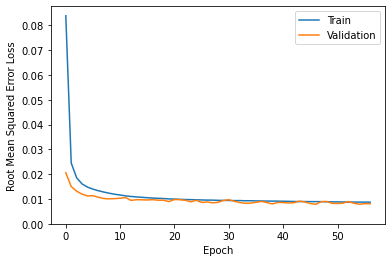

In [12]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.yticks(list(np.arange(0.0, 0.09, 0.01)))
plt.xlabel('Epoch')
plt.ylabel('Root Mean Squared Error Loss') 
#plt.title('Loss Over Time')
plt.legend(['Train','Validation'])

In [12]:
x_input = X_test.reshape((X_test.shape[0], n_input))

In [13]:
yhat = reconstructed_model.predict(x_input, verbose=0)
X_test_ = np.squeeze(X_test[:,-1,:])
yhat_ = np.squeeze(yhat[:,-1])
df_pred = pd.concat([pd.DataFrame(yhat_), pd.DataFrame(X_test_[:,1:][18:])], axis = 1)
rev_trans = sc.inverse_transform(df_pred)
pred = dataset[yhat.shape[0]*-1:]
pred['prediction']=rev_trans[:,0]

In [14]:
pred

,Pauillac,Verdon,Bordeaux,prediction
date (TU),,,,
2019-10-20 00:25:00,2.73,2.35,2.86,2.681966
2019-10-20 00:30:00,2.67,2.32,2.80,2.633981
2019-10-20 00:35:00,2.62,2.28,2.75,2.569583
2019-10-20 00:40:00,2.58,2.25,2.69,2.518123
2019-10-20 00:45:00,2.52,2.24,2.63,2.460534
...,...,...,...,...
2019-12-31 23:35:00,2.99,2.70,3.39,3.017877
2019-12-31 23:40:00,2.95,2.64,3.34,2.976132
2019-12-31 23:45:00,2.89,2.58,3.28,2.915622


In [15]:
import plotly.express as px

fig1 = px.line(pred, x = pred.index , y=pred['Pauillac'])
fig1.add_scatter(x = pred.index, y=pred['prediction'], mode= 'lines',name = "prediction")

fig1.update_xaxes(rangeslider_visible = True
                 )
fig1.show()


In [16]:
def conf_mat(prediction, target):
        # confusion matrix
        a,b,c,d=0,0,0,0
        
        for i in range(len(prediction)):
                if (target[i] >= 6.05) & (prediction[i] >= 6.05):
                    a = a + 1
                if (target[i] < 6.05) & (prediction[i] < 6.05):
                    d = d + 1
                if (target[i] <6.05) & (prediction[i] >= 6.05):
                    b = b+1
                if (target[i] >=6.05) & (prediction[i] < 6.05):
                    c = c+1
        

        POD = a/(a+c)
        FAR = b/(a+b)
        CSI = a/(a+b+c)


        return POD,FAR,CSI, a, b, c, d

In [17]:
def NASH(predictions, targets):

    differences1 = targets - predictions 
    differences2 = targets - targets.mean()


    differences_squared1 = sum(differences1 ** 2)
    differences_squared2 = sum(differences2 ** 2)                  

    nash_val = 1 - (differences_squared1/differences_squared2)          
    return nash_val  

In [35]:
nash = NASH(pred['prediction'],pred['Pauillac'])
print("NASH: ",nash)
   
#NASH_PM
#extract peaks
PM_obs = find_peaks(pred['Pauillac'], height =3, distance=100)[1]
PM_pred = find_peaks(pred['prediction'], height =3, distance=100)[1]
NASH_pm = NASH(PM_pred['peak_heights'],PM_obs['peak_heights'])
print("NASH_PM: ",NASH_pm)

#RMSE
import math
MSE = np.square(np.subtract(pred['prediction'],pred['Pauillac'])).mean() 
RMSE = math.sqrt(MSE)
print("RMSE:", RMSE)

#RMSE_PM
MSE_pm = np.square(np.subtract(np.array(PM_pred['peak_heights']), np.array(PM_obs['peak_heights']))).mean()
RMSE_PM = math.sqrt(MSE_pm)
print("RMSE_PM:", RMSE_PM)

#RMSE_supseuil
pred_seuil = pred[pred['Pauillac'] >= 6.05]
pred_seuil = pred_seuil.reset_index(drop=True)
MSE_sup = np.square(np.subtract(pred_seuil['Pauillac'],pred_seuil['prediction'])).mean() 
RMSE_sup = math.sqrt(MSE_sup)
print("RMSE_supseuil: ",RMSE_sup)

#CONFUSION MATRIX
pred=pred.reset_index(drop=True)
conf = conf_mat(pred['prediction'],pred['Pauillac'])
print("POD: ", conf[0])
print("FAR: ",conf[1])
print("CSI: ",conf[2])


NASH:  0.9968223497483178
NASH_PM:  0.9754843692781782
RMSE: 0.08290583631919736
RMSE_PM: 0.08350244590438277
RMSE_supseuil:  0.09781158120304356
POD:  0.7207792207792207
FAR:  0.08264462809917356
CSI:  0.676829268292683


In [28]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from scipy.signal import find_peaks, peak_prominences

indices, properties = find_peaks(pred['Pauillac'], height =3, distance=100)
indices1, properties1 = find_peaks(pred['prediction'], height =3, distance=100)

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scatter(
    y=pred.Pauillac,
    
    name='obs'
),secondary_y=False)

fig.add_trace(go.Scatter(
    y=pred.prediction,
    
    name='pred'
))
fig.add_trace(
    go.Scatter(y=pred['prediction']-pred['Pauillac'], name="error"),
    secondary_y=True, 
)
fig.add_trace(go.Scatter(
    x=indices,
    y=[pred.Pauillac[j] for j in indices],
    mode='markers',
    marker=dict(
        size=8,
        color='blue',
        symbol='cross'
    ),
    name='Peaks obs'
))

fig.add_trace(go.Scatter(
    x=indices1,
    y=[pred.prediction[j] for j in indices1],
    mode='markers',
    marker=dict(
        size=8,
        color='red',
        symbol='cross'
    ),
    name='Peaks pred'
    
))



fig.update_xaxes(rangeslider_visible = True
                 )
fig.show()
fig.write_html("/users/sanaa.el-bouhdidi/Projet2/MLP/MLP_2019_PLOT/error/MLP_lag_18_lead_12_relu.html")


In [21]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    
    go.Scatter(x = pred.index , y=pred['Pauillac'], name="obs"),
    secondary_y=False,
)

fig.add_trace(
    
    go.Scatter(x = pred.index, y=pred['prediction'], name="pred"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=pred.index, y=pred['prediction']-pred['Pauillac'], name="error"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Double Y Axis Example"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="water level Pauillac(m)", secondary_y=False)
fig.update_yaxes(title_text="error", secondary_y=True)
fig.update_xaxes(rangeslider_visible = True
                 )
fig.show()